## Kalibrierung einer Laseranlage

Bei einem 3D-Metalldrucker wird Metallpulver in einem Schicht zu Schicht Verfahren aufgetragen und durch einen Laserstrahl selektiv verschmolzen.  [Selektives_Laserschmelzen](https://de.wikipedia.org/wiki/Selektives_Laserschmelzen). Um den Prozess zu parallelisieren werden in einer solchen Anlage mehrere Laserstrahlen gleichzeitig verwendet. Diese Laserstrahlen bearbeiten teilweise gleichzeitig das selbe Bauteil. Um eine hohe Bauteilqualität zu gewährleisten müssen die Laserstrahlen über das gesamte Baufeld hinweg exakt zueinander ausgerichtet sein. Oftmas wird hierfür ein Kalibrierverfahren verwendet, bei welchem die Laserstrahlen ein Muster auf eine schwarz eloxierte Aluminiumplatte einbrennen (gravieren). Das gravierte Muster wird dann mit einer Kamera vermessen und die Abweichungen der Laserstrahlen zueinander berechnet. Diese Messergebnisse liefern dann die Werte anhand derer die Laserstrahlen kalibriert werden. Auf diese Weise können die Laserstrahlen mit einer Genauigkeit von besser als 1/5 Pix zueinander ausgerichtet werden. Die nachfolgende Abbildung zeigt ein Beispiel eines solchen Kalibriermusters eines 3d-Druckers mit 3 Laserstrahlen.

<div style="text-align: center;">
    <img src="./images/calibration_lowRes.jpg" width="40%">
    <p style="font-style: italic;">Laser Calibration Pattern</p>
</div>

Dabei markieren die jeweils 3 Laserstrahlen konzentrische Kreise an insgesamt 255 Positionen im gesamten Baufeld. Sind die unterschiedlichen Laserstrahlen passend zueinander kalibriert, so sollten die sind die von diesen markierten Kreise konzentrisch zueinander. Während bei der der oben gezeigten Abbidlung die Laserstrahlen gut kalibriert sind, zeigt der nachfolgende Ausschnitt eine Situation bei der die Lasestrahlen nicht korrekt zueinander ausgerichtet sind.

<div style="text-align: center;">
    <img src="./images/Registration_Misaligned.jpg" width="40%">
    <p style="font-style: italic;">Beispiel für nicht korrekt zueinander ausgerichtete Laserstrahlen</p>
</div>


## Aufgabenstellung

in dieser Programmierübung geht es darum an allen 255 Positionen die konzentrischen Kreise zu detektieren und diese dann farblich zu markieren. Hierfür kann der Hough-Kreistransformationsalgorithmus des skimage Paketes verwendet werden. Als Ausgangspunkt benötigt dieser Algorithmus ein binäres Kantenbild ( z.B. erzeugt mit dem Canny-Kantendetektor) in welchem dann die Kreise mit unterschiedlichen Radien gesucht werden können.

Um die Aufgabe Schritt für Schritt zu lösen, wird wie folgt vorgegangen:

* In einem ersten Schritt wird dazu die Kreisdetektion an einem kleinen Ausschnitt des Gesamtbildes implementiert.
* Im Anschluss soll die Kreisdetektion dann auf das gesamte Bild ausgeweitet werden.

In [1]:
# package import

%matplotlib ipympl
import numpy as np
import matplotlib.pyplot as plt
import cv2
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import skimage
from matplotlib.patches import Circle
import matplotlib

from modules.plotting import displayImagePlotly

um die spätere Bildverarbeitung etwas einfacher gestalten zu können wurde das oben gezeigte Kalibriermuster freigestellt und die nicht von Interesse Bereiche schwarz eingefärbt (`images/registrationImage_8Bit.png`).  

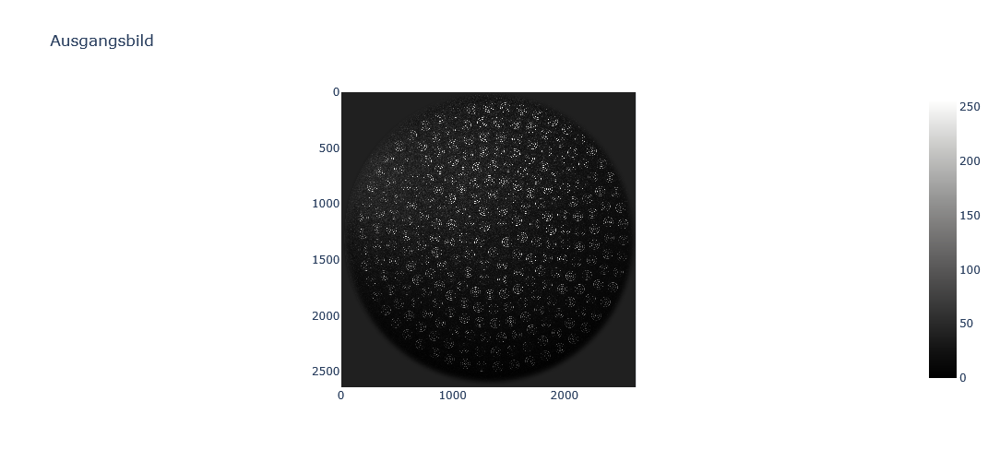

Datentyp des Bildes: uint8
Größe des Bildes: (2641, 2641)


In [2]:
# load and display image
img = cv2.imread('images/registrationImage_8Bit.png', cv2.IMREAD_GRAYSCALE)
displayImagePlotly(img, title='Ausgangsbild')

#Datentyp:
imageDataType = img.dtype
#Bildgröße
imageShape = img.shape  

# Ausgabe der Daten
print(f'Datentyp des Bildes: {imageDataType}')
print(f'Größe des Bildes: {imageShape}')


## Teil-Bildausschnitt Erzeugen
#### Aufgabe
Erzeugen Sie ein Testbild mit denen Sie die Kreisdetektion an einem kleinen Ausschnitt des gesamten Bildes testen können. Definieren Sie dazu eine ROI (Region of Interest) um einen der konzentrischen Kreise und legen Sie dieses Teilbild in einer separaten Variablen 'img_roi' ab.

<div style="text-align: center;">
    <img src="./images/results/concentricCircles_Detail.png" width="20%">
    <p style="font-style: italic;">Wählen Sie einen Bildausschnitt, der nur eines der konzentrischen Muster abbildet.</p>
</div>


##### *Hinweis*

* den Bildausschnitt wählen können Sie mit Hilfe folgender Synthax `img[y1:y2, x1:x2]`
* um eine Kopie des Bildausschnittes zu verwenden rufen Sie die `np.copy()` Funktion auf. Diese gewährleistet dass Sie eine echte Kopie des Bildausschnittes erhalten und nicht nur eine Referenz auf das Originalbild.



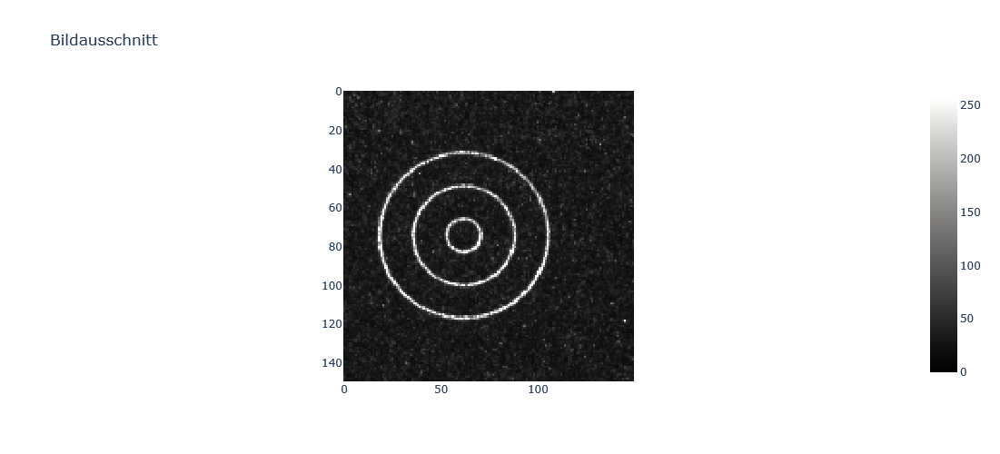

In [3]:
###
## ENTER YOUR CODE HERE
###

# use .copy() to create a copy of the image ROI
# img_roi = img[xxx:xxx, xxxx:xxxx].copy()

img_roi = img[1125:1275, 1220:1370].copy()

displayImagePlotly(img_roi, title='Bildausschnitt')

### Teilbild Erkennen

#### Kantenbild Erzeugen

#### Aufgabe

* Wandeln Sie den Bildausschnitt in ein Kantenbild um, sodass jede der gravierten Kontzuren durch eine einzelne Kante mit einer Breite von einem Pixel dargestellt wird.
* Zeigen Sie nach jedem Ihrer Zwischenschritte ihr Bild zur Kontrolle an.
* Speichern Sie das Kantenbild in einer Variablen `img_edges` ab
* Lagern sie den Code zur Erzeugung des Kantenbildes in eine Funktion `preprocessImage(img)` aus, welche das Kantenbild zurückliefert.

##### Hinweis
* Verwenden Sie hierfür den Canny-Kantendetektor aus dem skimage Paket. `skimage.feature.canny()` [https://scikit-image.org/docs/0.25.x/auto_examples/edges/plot_canny.html](https://scikit-image.org/docs/0.25.x/auto_examples/edges/plot_canny.html); [https://scikit-image.org/docs/0.25.x/api/skimage.feature.html#skimage.feature.canny](https://scikit-image.org/docs/0.25.x/api/skimage.feature.html#skimage.feature.canny)
* Das Ergebniss des Canny-Detektors muss jedoch noch weiter vorverarbeitet werden, da nach dem Canny Detekror jede lasergravierte Linie durch 2 Kanten dargestellt wird.
* Durch geschicktes anwenden von mporphologischen Operationen können die Kanten so verarbeitet werden, dass jede lasergravierte Linie durch eine einzelne Kante dargestellt wird.
  * Eine kurze Einführung in die Wirkweise morphologischer Operationen finden Sie unter: 
    * [https://towardsdatascience.com/understanding-morphological-image-processing-and-its-operations-7bcf1ed11756/](https://towardsdatascience.com/understanding-morphological-image-processing-and-its-operations-7bcf1ed11756/)
  *  Folgende Funktionen könnten Ihnen hierfür hilfreich sein:
    * `skimage.morphology.binary_closing()` [https://scikit-image.org/docs/0.25.x/api/skimage.morphology.html#skimage.morphology.binary_closing](https://scikit-image.org/docs/0.25.x/api/skimage.morphology.html#skimage.morphology.binary_closing)
    * `skimage.morphology.binary_opening()` [https://scikit-image.org/docs/0.25.x/api/skimage.morphology.html#skimage.morphology.binary_opening](https://scikit-image.org/docs/0.25.x/api/skimage.morphology.html#skimage.morphology.binary_opening)

    * `skimage.morphology.binary_dilation()` [https://scikit-image.org/docs/0.25.x/api/skimage.morphology.html#skimage.morphology.binary_dilation](https://scikit-image.org/docs/0.25.x/api/skimage.morphology.html#skimage.morphology.binary_dilation)
    * `skimage.morphology.binary_erosion()` [https://scikit-image.org/docs/0.25.x/api/skimage.morphology.html#skimage.morphology.binary_erosion](https://scikit-image.org/docs/0.25.x/api/skimage.morphology.html#skimage.morphology.binary_erosion)

    * `skimage.morphology.skeletonize()` [https://scikit-image.org/docs/0.25.x/auto_examples/edges/plot_skeleton.html](https://scikit-image.org/docs/0.25.x/auto_examples/edges/plot_skeleton.html)
    * Um die Aufgabe zu lösen müssen Sie geschickt verschiedene morphologische Operationen kombinieren. Versuchen Sie zuerst die Lücken zwischen den detektierten Außenkanten zu schließen um danach die Mitte der mit dem Laser markieren Linie zu erzeugen.

  


<div style="text-align: center;">
    <img src="./images/results/concentricCircles_Canny.png" width="20%">
    <p style="font-style: italic;">Kantenbild (Canny Edge Detection) des Bildausschnittes. Jede Gravurlinie besitzt 2 Kanten.</p>
</div>

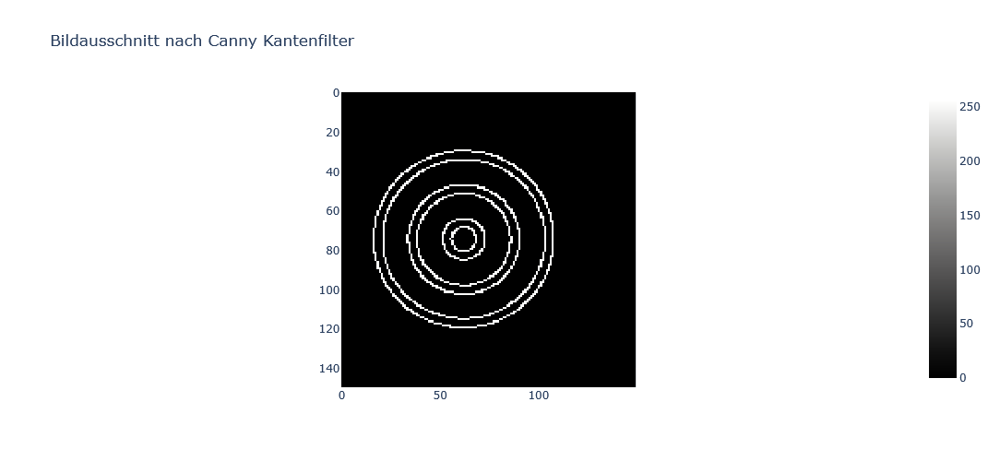

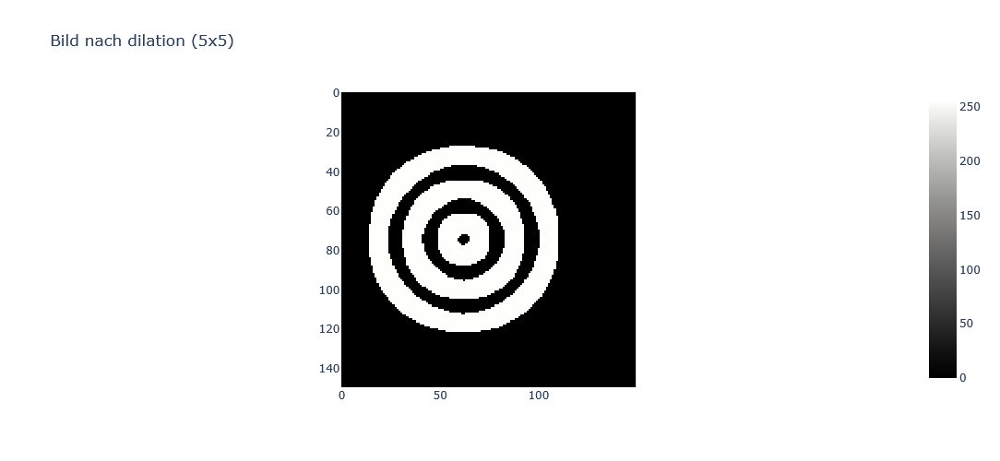

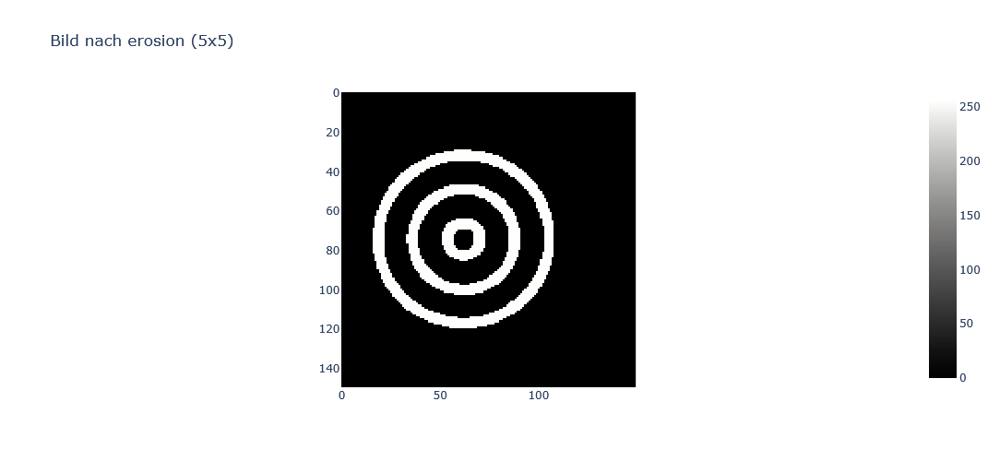

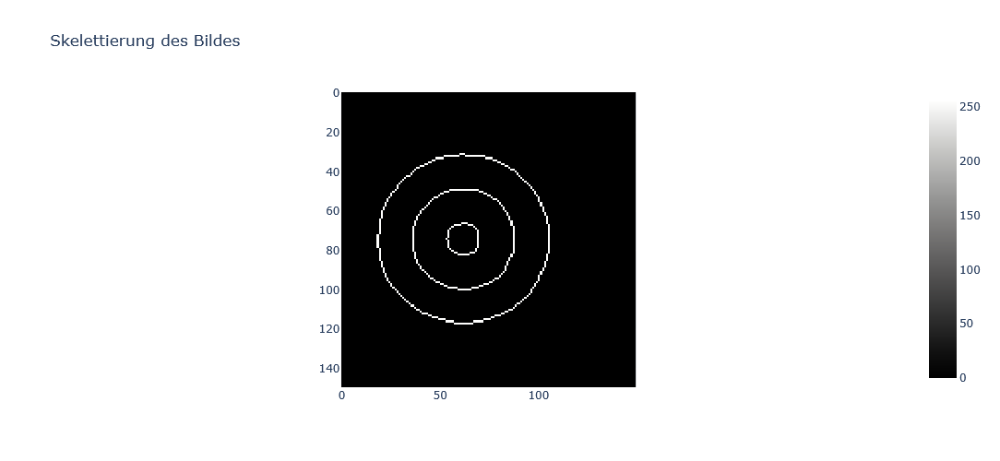

In [4]:
####
## ENTER YOUR CODE HERE
####

# apply Canny-Edge-Detection
# canny_filtered = 
# displayImagePlotly(canny_filtered, title='Bildausschnitt nach Canny Kantenfilter')


# test different morphological operations
# morph_image =
# displayImagePlotly(morph_image, title='Bildausschnitt nach Canny Kantenfilter')

# try to get clean conturs, representing the center of the laser-marked circular lines

canny_filtered = skimage.feature.canny(img_roi, sigma=2)
displayImagePlotly(canny_filtered, title='Bildausschnitt nach Canny Kantenfilter')

dilated = skimage.morphology.binary_dilation(canny_filtered, np.ones((5,5)))
displayImagePlotly(dilated, title='Bild nach dilation (5x5)')


eroded = skimage.morphology.binary_erosion(dilated, np.ones((5,5)))
displayImagePlotly(eroded, title='Bild nach erosion (5x5)')

skeleton = skimage.morphology.skeletonize(eroded)
displayImagePlotly(skeleton, title='Skelettierung des Bildes')



##### So sollte Ihr Bild nach der Vorverarbeitung aussehen:


<div style="text-align: center;">
    <img src="./images/results/concentricCircles_Skeleton.png" width="20%">
    <p style="font-style: italic;">Bild nach der Vorverarbeitung</p>
</div>


#### Auslagerung der Vorverarbeitung

#### Aufgabe
* Lagern sie den Code zur Vorverarbeitung in eine Funktion `preprocessImage(img)` aus, welche das Kantenbild zurückliefert.
* Testen Sie Ihre Funktion indem Sie diese auf dem Bildausschnitt `img_roi` und das Ausgangsbild `img` anwenden. Zeigen Sie die Bilder danach an.


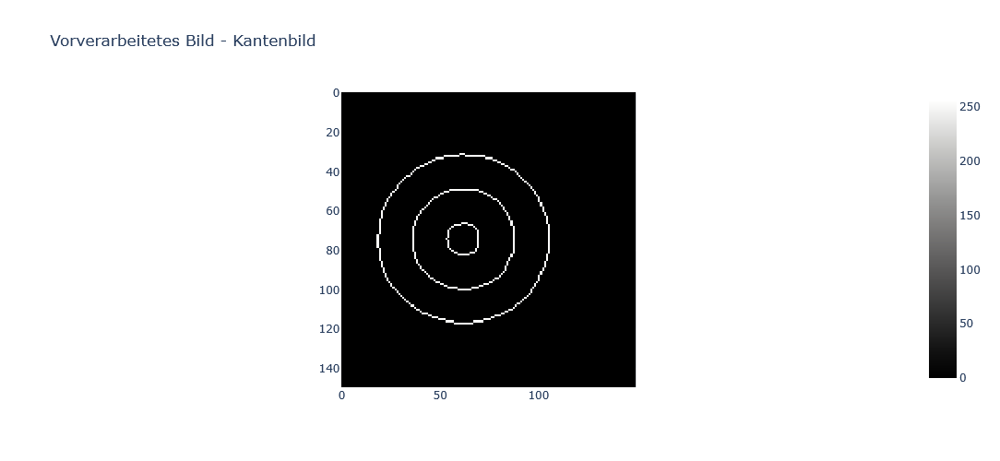

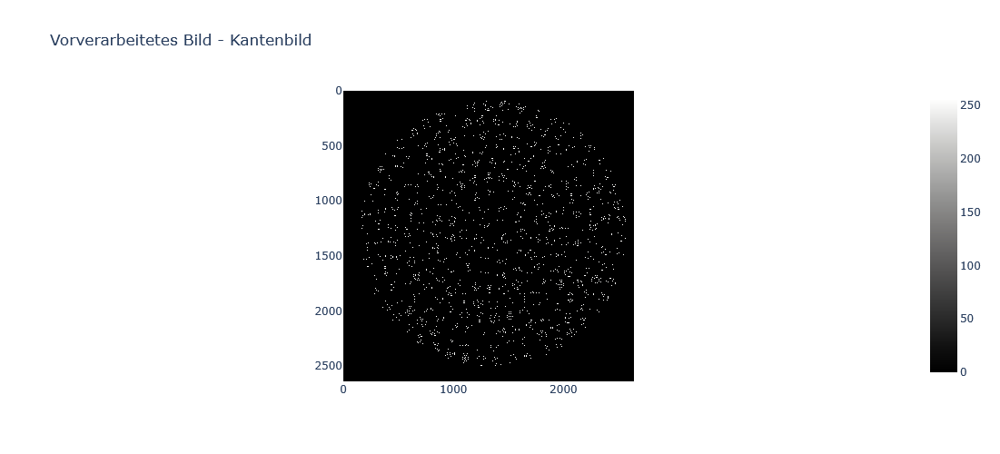

In [5]:
def preprocessImage(image):
    """Preprocess image to extract single-pixel edge contours.
    
    Args:
        image: Grayscale input image.
    
    Returns:
        Binary skeleton image with single-pixel edges.
    """
    ####
    ## ENTER YOUR CODE HERE
    ####

    canny_filtered = skimage.feature.canny(image, sigma=2)
    dilated = skimage.morphology.binary_dilation(canny_filtered, np.ones((5,5)))
    eroded = skimage.morphology.binary_erosion(dilated, np.ones((5,5)))

    skeleton = skimage.morphology.skeletonize(eroded)
    return skeleton






######
## ENTER YOUR CODE HERE
######

# img_roi: call preprocess image display 
img_roi_preprocessed = preprocessImage(img_roi)
displayImagePlotly(img_roi_preprocessed, title='Vorverarbeitetes Bild - Kantenbild')

# img: call preprocess image display
img_preprocessed = preprocessImage(img)
displayImagePlotly(img_preprocessed, title='Vorverarbeitetes Bild - Kantenbild')

#### Kreise im Teilbild erkennen.

##### Erkennung des größten Kreises

##### Aufgabe 

Detektieren Sie den größten der drei kontentrischen Kreise im Teilbild mit Hilfe der Hough-Funktion des skimage Paketes. Hierzu benötigen Sie die Funktionen:

* `skimage.transform.hough_circle()` [https://scikit-image.org/docs/0.25.x/api/skimage.transform.html#skimage.transform.hough_circle](https://scikit-image.org/docs/0.25.x/api/skimage.transform.html#skimage.transform.hough_circle)
* `skimage.transform.hough_circle_peaks()` [https://scikit-image.org/docs/0.25.x/api/skimage.transform.html#skimage.transform.hough_circle_peaks](https://scikit-image.org/docs/0.25.x/api/skimage.transform.html#skimage.transform.hough_circle_peaks)

Zeichnen Sie danach den Kreis in das Originalbild ein. Nutzen Sie hierfür die Matplotlib Funktion `matplotlib.patches.Circle` [https://matplotlib.org/stable/api/_as_gen/matplotlib.patches.Circle.html](https://matplotlib.org/stable/api/_as_gen/matplotlib.patches.Circle.html) um den Kreis in das Bild einzufügen.






*Hinweise:*

* Lesen Sie die Kreisdurchmesser / Radien aus den angezeigten Bildern aus. Alternativ können Sie auch ein Bildbearbeitungsprogramm wie **imageJ** oder **Gimp** verwenden.
* Um einen Kreis mit einem bestimmten Radius zu detektieren, müssen Sie diesen Radius als Parameter an die Funktion `skimage.transform.hough_circle()` übergeben.  Erzeugen Sie hierzu einen  numpy-Array`np.array([Radius])` das als einzigen Eintrag den gewünschten Radius enthält.

* In der Übung "01_Uebung_ImplementHoughCircles.ipynb" haben Sie bereits Kreise mit dem Matplotlib Paket gezeichnet. Nutzen Sie den dortigen Code als Vorlage
* Ein Anwendungsbeispiel der Hough Kreistransformation finden Sie hier:
    * [https://scikit-image.org/docs/0.25.x/auto_examples/edges/plot_circular_elliptical_hough_transform.html](https://scikit-image.org/docs/0.25.x/auto_examples/edges/plot_circular_elliptical_hough_transform.html)


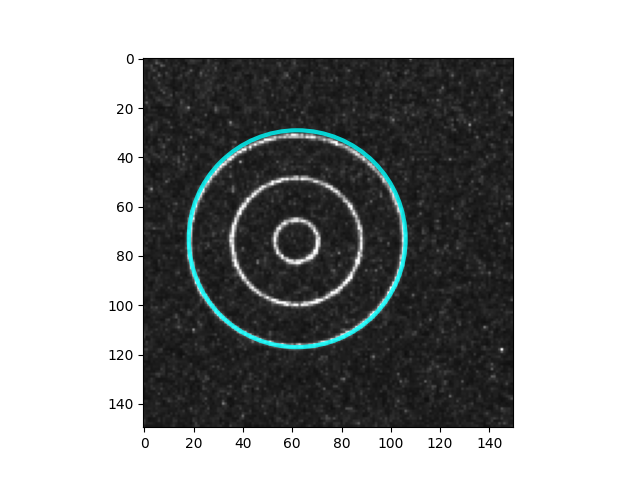

In [6]:
#####
## ENTER YOUR CODE HERE
#####

# define circle search radius
# hough_radius = np.array([?????])
hough_radius = np.array([44])

# create accumulator Image
hough_res = skimage.transform.hough_circle(img_roi_preprocessed, hough_radius)

# analyze accumulatio image and find circle
accums, cx, cy, radii = skimage.transform.hough_circle_peaks(hough_res,
                                                                hough_radius,
                                                                min_xdistance = 70,
                                                                min_ydistance = 70,
                                                                threshold = 0,
                                                                num_peaks=255)




# display image 
fig, ax = plt.subplots(1,1)


# add circle patch to image
for center_x, center_y, radius in zip(cx, cy, radii):
    circle = Circle((center_x, center_y), radius,
                    color='cyan',          # Cyan color
                    linestyle='-',         # Solid line
                    linewidth=3,           # Thicker line
                    alpha=0.8,             # Slightly transparent
                    fill=False)            # Do not fill the circle
    
    # Add the circle to the axes
    ax.add_patch(circle)
    
ax.imshow(img_roi, cmap='gray', vmin=0, vmax=255)

##### Auslagern der Kreiserkennung in eine Funktion

Lagern Sie nun der Code zur Erkennung der Kreiserkennung in eine Funktion `detectCircles(img, radii)` aus, welche das Kantenbild `img` und den zu erkennenden Radius `radius` übergeben bekommt und das Zentrum der erkannten Kreises als Liste zurückliefert (`cx`, `cy`, `radii`).

In [7]:
def detectCircles(image, radius):
    """Detect circles in a preprocessec image using Hough Transform.
    
    Args:
        image : Grayscale input image.
        radius : Radius of the circles to detect.
    
    Returns:
        cx, cy, radii: Detected center coordinates and radii of the circle. All arrays have the same length.
    """
    #####
    ## ENTER YOUR CODE HERE
    #####



    hough_radii = np.array([radius])
    hough_res = skimage.transform.hough_circle(image, hough_radii)
    accums, cx, cy, radii = skimage.transform.hough_circle_peaks(hough_res,
                                                                 hough_radii,
                                                                 min_xdistance = 70,
                                                                 min_ydistance = 70,
                                                                 threshold = 0,
                                                                 num_peaks=255)

    return cx, cy, radii

Detektieren Sie nun auch die beiden kleineren Kreise und zeigen Sie diese an.

<div style="text-align: center;">
    <img src="./images/results/concentricCircles_Detected.png" width="20%">
    <p style="font-style: italic;">Erkannte Kreise im Bildausschnitt.</p>
</div>

In [8]:
## Detect all circles

#####
## ENTER YOUR CODE HERE
#####


# detect outer circle
cx_44, cy_44, radii_44 = detectCircles(img_roi_preprocessed, 44)

# detect middle circle
cx_26, cy_26, radii_26 = detectCircles(img_roi_preprocessed, 26)

# detect inner circle
cx_8, cy_8, radii_8 = detectCircles(img_roi_preprocessed, 8)    

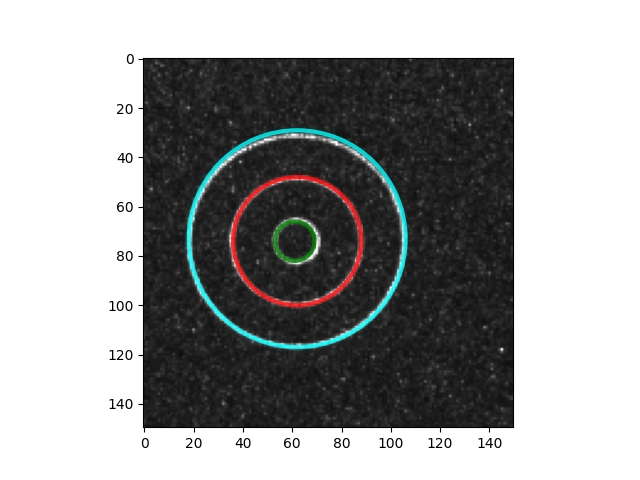

In [9]:
# display image and add all circles as patches

#####
## ENTER YOUR CODE HERE
#####



fig, ax = plt.subplots(1,1)

# Display the image using imshow
ax.imshow(img_roi, cmap='gray', vmin=0, vmax=255)

for center_x, center_y, radius in zip(cx_44, cy_44, radii_44):
    circle = Circle((center_x, center_y), radius,
                    color='cyan',          # Cyan color
                    linestyle='-',         # Solid line
                    linewidth=3,           # Thicker line
                    alpha=0.8,             # Slightly transparent
                    fill=False)            # Do not fill the circle
    
    # Add the circle to the axes
    ax.add_patch(circle)
    
for center_x, center_y, radius in zip(cx_26, cy_26, radii_26):
    circle = Circle((center_x, center_y), radius,
                    color='red',          # Cyan color
                    linestyle='-',         # Solid line
                    linewidth=3,           # Thicker line
                    alpha=0.8,             # Slightly transparent
                    fill=False)            # Do not fill the circle
    
    # Add the circle to the axes
    ax.add_patch(circle)
    
for center_x, center_y, radius in zip(cx_8, cy_8, radii_8):
    circle = Circle((center_x, center_y), radius,
                    color='green',          # Cyan color
                    linestyle='-',         # Solid line
                    linewidth=3,           # Thicker line
                    alpha=0.8,             # Slightly transparent
                    fill=False)            # Do not fill the circle
    
    # Add the circle to the axes
    ax.add_patch(circle)

plt.show()

### Kreise im gesamten Bild erkennen.

#### Aufgabe

Detektieren Sie nun alle konzentrische Kreise im gesamten Bild und zeigen sie diese zusammen mit dem Originalbild an.

<div style="text-align: center;">
    <img src="./images/results/Registration_Result.png" width="30%">
    <p style="font-style: italic;">Kantenbild (Canny Edge Detection) des Bildausschnittes. Jede Gravurlinie besitzt 2 Kanten.</p>
</div>


*Hinweise*

* Führen Sie für jeden gesuchten Radius die Detektion der Kreismittelpunkte separat durch.
* Es könnte sein, dass Sie die Parameter der Hough-Transformation anpassen müssen, damit alle Kreise erkannt werden. Es könnte helfen folgende Parameter der Funktion `skimage.transform.hough_circle_peaks()` anzupassen:
    + `min_xdistance` : min Abstand zwischen den Mittelpunkten zweier erkannter Kreise in x-Richtung [Pix]
    + `min_ydistance` : min Abstand zwischen den Mittelpunkten zweier erkannter Kreise in y-Richtung [Pix]
    + `threshold` : min Wert im Akkumulator damit eine Kreis erkannt wird. Je kleiner dieser Wert ist, desto mehr Kreise werden erkannt
    + `num_peaks` : maximale Anzahl der zu erkennenden Kreise. Mit diesem Parameter lässt sich die Gesamtzahl der zu erkennenden Kreise begrenzen.

In [10]:
# preprocess image: Full image

#####
## Enter Your Code Here
#####

img_preprocess = preprocessImage(img)

In [11]:
######
## ENTER YOUR CODE HERE
######

# detect outer circle
cx_44, cy_44, radii_44 = detectCircles(img_preprocess, 44)

# detect middle circle
cx_26, cy_26, radii_26 = detectCircles(img_preprocess, 26)

# detect inner circle
cx_8, cy_8, radii_8 = detectCircles(img_preprocess, 8)    


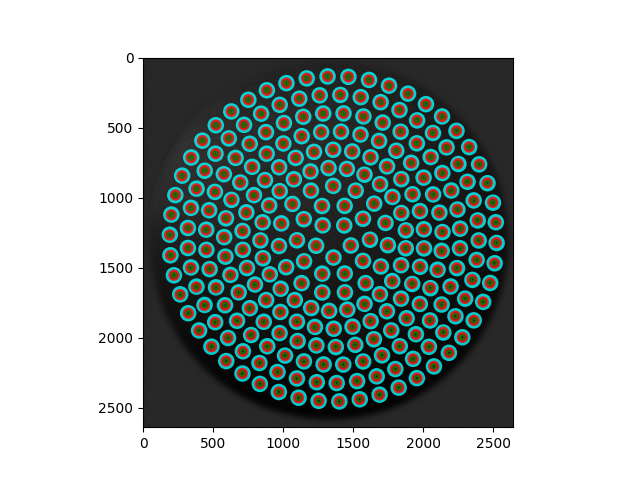

In [12]:
fig, ax = plt.subplots(1,1)

# Display the image using imshow
ax.imshow(img, cmap='gray', vmin=0, vmax=255)

for center_x, center_y, radius in zip(cx_44, cy_44, radii_44):
    circle = Circle((center_x, center_y), radius,
                    color='cyan',          # Cyan color
                    linestyle='-',         # Solid line
                    linewidth=3,           # Thicker line
                    alpha=0.8,             # Slightly transparent
                    fill=False)            # Do not fill the circle
    
    # Add the circle to the axes
    ax.add_patch(circle)
    
for center_x, center_y, radius in zip(cx_26, cy_26, radii_26):
    circle = Circle((center_x, center_y), radius,
                    color='red',          # Cyan color
                    linestyle='-',         # Solid line
                    linewidth=3,           # Thicker line
                    alpha=0.8,             # Slightly transparent
                    fill=False)            # Do not fill the circle
    
    # Add the circle to the axes
    ax.add_patch(circle)
    
for center_x, center_y, radius in zip(cx_8, cy_8, radii_8):
    circle = Circle((center_x, center_y), radius,
                    color='green',          # Cyan color
                    linestyle='-',         # Solid line
                    linewidth=3,           # Thicker line
                    alpha=0.8,             # Slightly transparent
                    fill=False)            # Do not fill the circle
    
    # Add the circle to the axes
    ax.add_patch(circle)